<a href="https://colab.research.google.com/github/ebinjomonkottakal/Computer-Vision-Projects/blob/main/Object_Detection_using_Tensorflow_hub_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image,ImageFont,ImageDraw
from six import BytesIO
from six.moves.urllib.request import urlopen
import io
import pathlib
import scipy.misc

**Function to preprocess image**

In [ ]:
def load_image_into_numpy_array(path):
  image = None
  if (path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path,'rb').read()
    image = Image.open(BytesIO(image_data))
  (width,height) = image.size
  return np.array(image.getdata()).reshape((1,height,width,3)).astype(np.uint8)

**Loading model from hub**

In [67]:
model_path =  'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1'
model = hub.load(model_path)

**Cloning and Installing Object Detection API**

In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3843, done.
remote: Counting objects: 100% (3843/3843), done.
remote: Compressing objects: 100% (2950/2950), done.
remote: Total 3843 (delta 1109), reused 1948 (delta 842), pack-reused 0
Receiving objects: 100% (3843/3843), 49.59 MiB | 27.08 MiB/s, done.
Resolving deltas: 100% (1109/1109), done.


In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .


Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.6.1.3-2ubuntu5.2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 78.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 85.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [61]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops
%matplotlib inline


**Load Label Map**

In [62]:
label_map_path = '/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(label_map_path,use_display_name=True)

**Image Selection**

In [76]:
image_path = 'https://upload.wikimedia.org/wikipedia/commons/7/7a/African_Animals_%28cropped%29.jpg'
image = load_image_into_numpy_array(image_path)

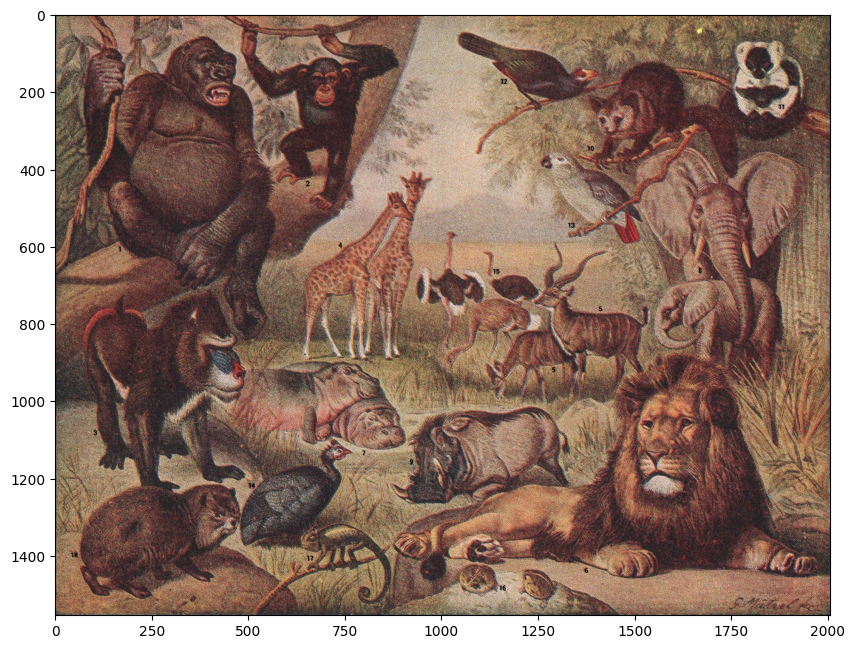

In [77]:

plt.figure(figsize=(10,10))
plt.imshow(image[0])
plt.show()


**Doing the inference**

In [78]:
result = model(image)
print({key:value for key,value in result.items()}.keys())

dict_keys(['detection_boxes', 'detection_multiclass_scores', 'raw_detection_scores', 'detection_anchor_indices', 'num_detections', 'detection_scores', 'detection_classes', 'raw_detection_boxes'])


**Visualizing the results**

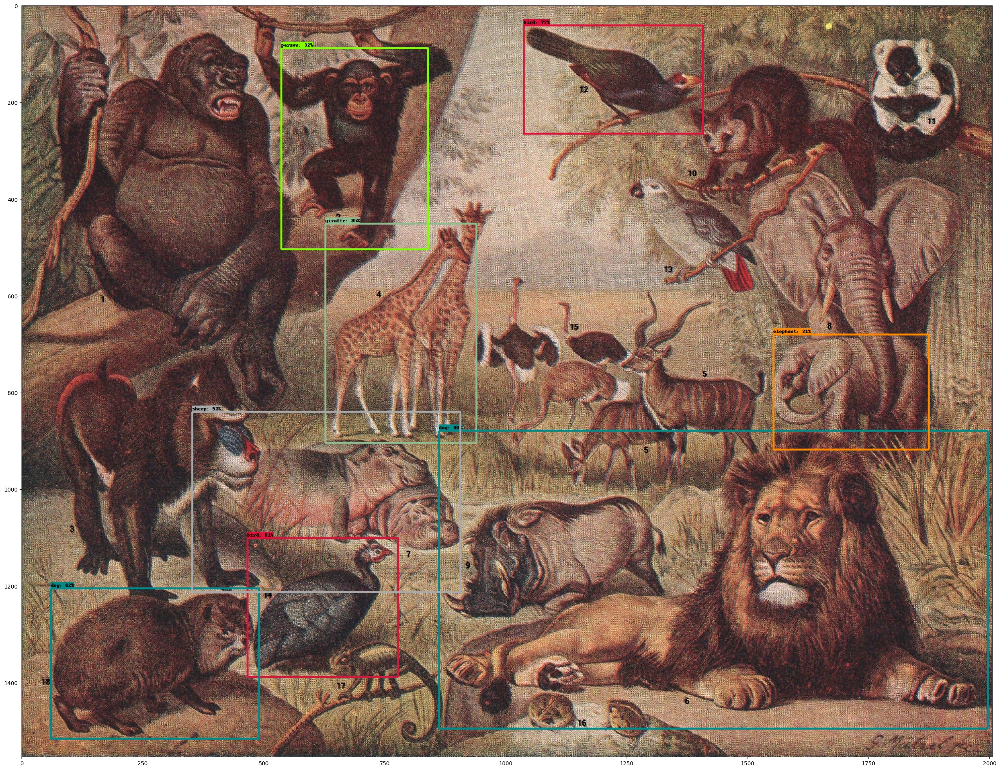

In [79]:
image_np = image.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np[0],
    result['detection_boxes'][0].numpy(),
    (result['detection_classes'][0].numpy()).astype(int),
    result['detection_scores'][0].numpy(),
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw = 200,
    min_score_thresh = .30,
    agnostic_mode=False

)

plt.figure(figsize= (32,32))
plt.imshow(image_np[0])
plt.show()